In [1]:
import torch
from torch import nn
from torch import optim
from torch.autograd import Variable
import torchvision

# Define the Generator and Discriminator Newtorks

In [2]:
# All networks should inherit `nn.Module`
class Generator(nn.Module):
    """
    Takes a 100 element input vector and transforms
    it into an image with dimensions 64x64
    
    input is bacth_size x n_ch x width x height.
    In this case, (batch_size, 100, 1, 1)
    """
    
    # Note on convolutional transpose operations:
    # Input: (batch, chs_in, h_in, w_in)
    # Output: (batch, chs_out, h_out, w_out)
    # h_out = (h_in-1) * stride - 2 * padding + kernel
    
    # Anything with optimizable parameters needs to be
    # setup within the init method
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            
            # Hidden Layer 1
            nn.ConvTranspose2d(in_channels=100, 
                               out_channels=256,
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            
            # Hidden Layer 2
            nn.ConvTranspose2d(in_channels=256,
                               out_channels=128,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            
            # Hidden Layer 3
            nn.ConvTranspose2d(in_channels=128,
                               out_channels=64,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            
            # Hidden Layer 4
            nn.ConvTranspose2d(in_channels=64,
                               out_channels=32,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            
            # Hidden Layer 5
            nn.ConvTranspose2d(in_channels=32,
                               out_channels=16,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=16),
            nn.ReLU(),
            
            # Output Layer
            nn.ConvTranspose2d(in_channels=16, 
                               out_channels=1,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.Tanh()
        )
        
    # All modules must override `forward`
    def forward(self, x):
        x = self.main(x)
        return x

In [3]:
# Confirm the generator creates an image when given noise
# Map from (batch, 100, 1, 1) to (batch, 1, 32, 32)
G = Generator()
G(torch.randn(12, 100, 1, 1)).shape

torch.Size([12, 1, 128, 128])

In [4]:
class Discriminator(nn.Module):
    """
    Takes in a 32x32 image and produces a decision
    about if that image is genuine or generated.
    
    Input is (bacth_size x n_ch x width x height)
    In this case (100, 1, 64, 64)
    """
    
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # input is 1ch x 64w x 64h
        # nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.main = nn.Sequential(
            
            # (batch_size, 1, 64, 64)
            nn.Conv2d(in_channels=1,
                      out_channels=32,
                      kernel_size=4,
                      stride=2,
                      padding=1, 
                      bias=False),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 64, 32, 32)
            nn.Conv2d(in_channels=32,
                      out_channels=64,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=64),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 128, 16, 16)
            nn.Conv2d(in_channels=64,
                      out_channels=128,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=128),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 256, 8, 8)
            nn.Conv2d(in_channels=128,
                      out_channels=256,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=256),
            nn.LeakyReLU(negative_slope=0.2),
            
            # Extra layer
            # (batch_size, 512, 4, 4)
            nn.Conv2d(in_channels=256,
                      out_channels=512,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=512),
            nn.LeakyReLU(negative_slope=0.2),
            
            nn.Conv2d(in_channels=512,
                      out_channels=1,
                      kernel_size=4,
                      stride=1,
                      padding=0,
                      bias=False),
            
            # (batch_size, 1, 1, 1)
            nn.Sigmoid()
        )
        
        
    def forward(self, x):
        x = self.main(x)
        return x

In [5]:
# Confirm the discriminator produces a ruling given an image
# Map from (batch, 1, 64, 64) to (batch, 1, 1, 1)
D = Discriminator()
D(torch.randn(14, 1, 128, 128)).shape

torch.Size([14, 1, 1, 1])

# Prepare Data
### Note: All images are of size 64 x 86

In [6]:
def build_data_loader(batch_size):
    dataset = torchvision.datasets.ImageFolder(
        root='/home/seif.younis/Deep Learning and Medical Imaging/images_128',
        transform=torchvision.transforms.Compose([
            torchvision.transforms.Resize(128), # Make smallest dimension 32
            torchvision.transforms.CenterCrop(128), # Cut to square image
            torchvision.transforms.Grayscale(), # Convert to grayscale
            torchvision.transforms.ToTensor(), # Transform from PIL image to Tensor
        ]))
    
    return torch.utils.data.DataLoader(dataset, batch_size=batch_size)

In [7]:
# Utility methods for displaying data during training
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def show_images(images):
    img = torchvision.utils.make_grid(images, normalize=True)
    npy_img = img.numpy()
    plt.figure(figsize = (20,2))
    plt.imshow(np.transpose(npy_img, (1, 2, 0)),
               interpolation='nearest')
    plt.show()

torch.Size([8, 1, 128, 128])


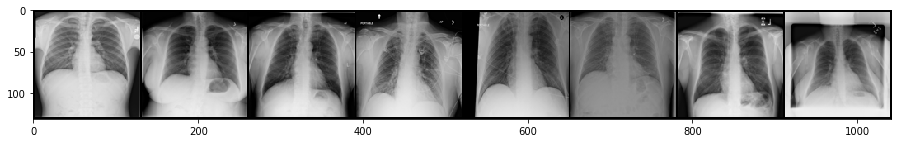

In [8]:
# Test on one a handful of images
# ...<rimshot.wav> :P
for data, _ in build_data_loader(8):
    test_images = data
    break
    
print(test_images.shape)
show_images(test_images)

# Perform Training

In [9]:
# Choose a loss function. Binary Cross Entropy Loss.
compute_loss = nn.BCELoss()

In [10]:
# Specify training details
n_epochs = 100
batch_size = 100

In [11]:
# Move everything to the GPU for training
gpu = torch.device(3)

G = nn.DataParallel(G, [3,4,5,6])
G = G.to(gpu)

D = nn.DataParallel(D, [3,4,5,6])
D = D.to(gpu)

In [12]:
# Create an optimizer to update the weights of each network
optimizer_d = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_g = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [13]:
data_loader = build_data_loader(batch_size)
test_noise = torch.randn((8, 100, 1, 1)).to(gpu)

Epoch: 0/100
Example images:


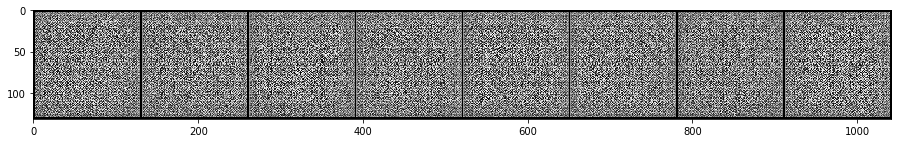

Epoch: 0	Batch: 100/101
Loss G: 8.687057495117188
Loss D: 0.0018672940786927938
Epoch: 1/100
Example images:


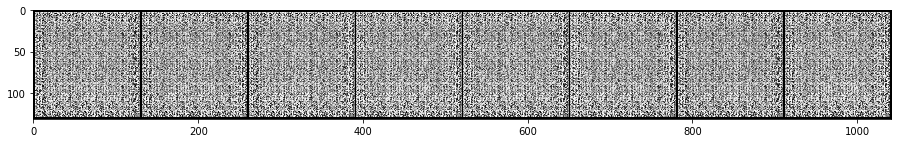

Epoch: 1	Batch: 100/101
Loss G: 15.961098670959473
Loss D: 0.8445159196853638
Epoch: 2/100
Example images:


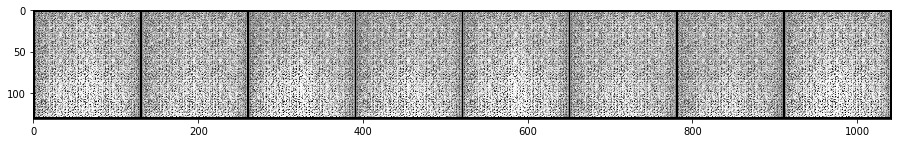

Epoch: 2	Batch: 100/101
Loss G: 8.826149940490723
Loss D: 0.2194865196943283
Epoch: 3/100
Example images:


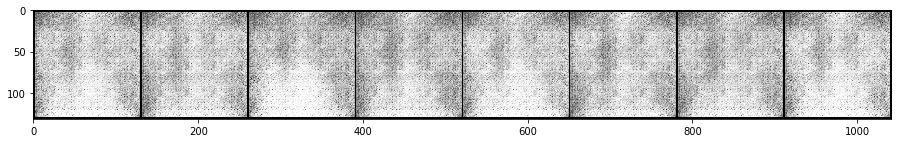

Epoch: 3	Batch: 100/101
Loss G: 5.058393478393555
Loss D: 0.127945214509964
Epoch: 4/100
Example images:


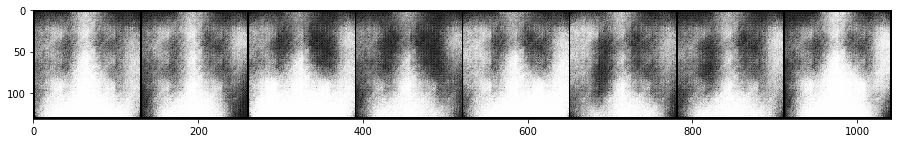

Epoch: 4	Batch: 100/101
Loss G: 5.113949298858643
Loss D: 0.17808975279331207
Epoch: 5/100
Example images:


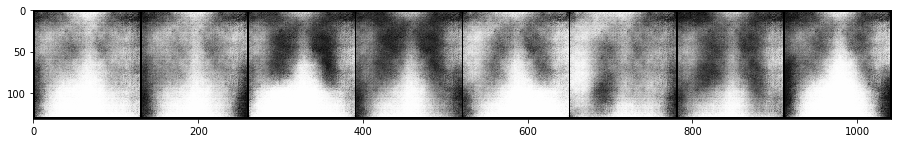

Epoch: 5	Batch: 100/101
Loss G: 17.354028701782227
Loss D: 1.695195198059082
Epoch: 6/100
Example images:


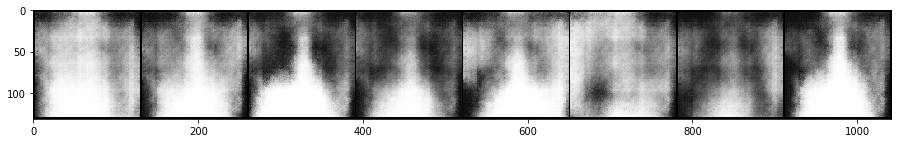

Epoch: 6	Batch: 100/101
Loss G: 1.6849291324615479
Loss D: 2.513589859008789
Epoch: 7/100
Example images:


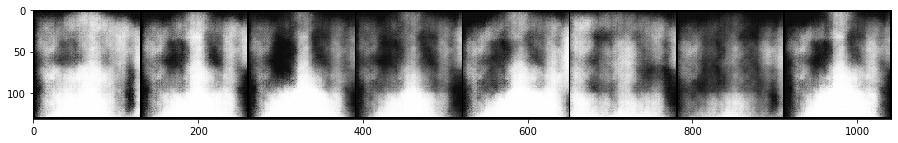

Epoch: 7	Batch: 100/101
Loss G: 15.248592376708984
Loss D: 0.5418092608451843
Epoch: 8/100
Example images:


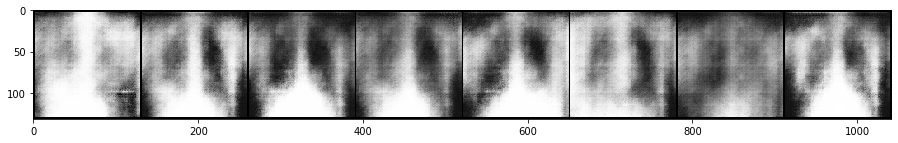

Epoch: 8	Batch: 100/101
Loss G: 5.70355749130249
Loss D: 0.024724667891860008
Epoch: 9/100
Example images:


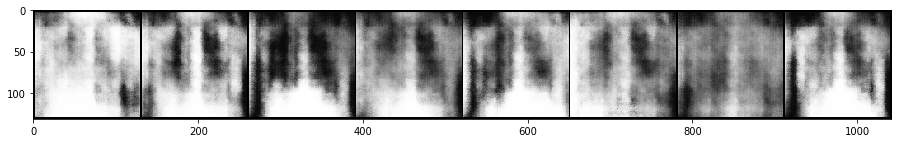

Epoch: 9	Batch: 100/101
Loss G: 5.666496276855469
Loss D: 0.016248662024736404
Epoch: 10/100
Example images:


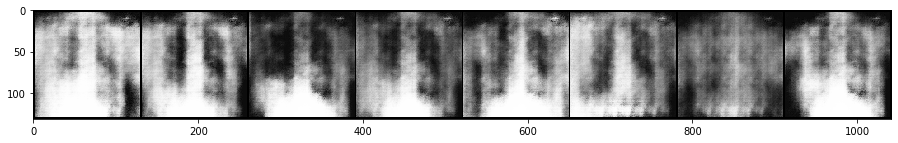

Epoch: 10	Batch: 100/101
Loss G: 5.545464992523193
Loss D: 0.020450983196496964
Epoch: 11/100
Example images:


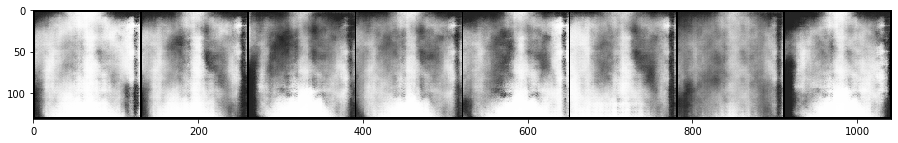

Epoch: 11	Batch: 100/101
Loss G: 7.654205799102783
Loss D: 0.888530433177948
Epoch: 12/100
Example images:


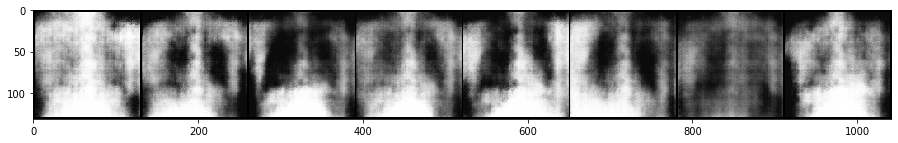

Epoch: 12	Batch: 100/101
Loss G: 11.874709129333496
Loss D: 0.11602433770895004
Epoch: 13/100
Example images:


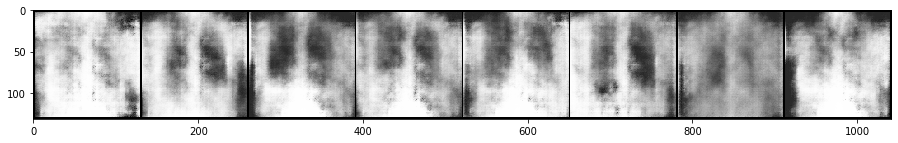

Epoch: 13	Batch: 100/101
Loss G: 14.586479187011719
Loss D: 0.32679980993270874
Epoch: 14/100
Example images:


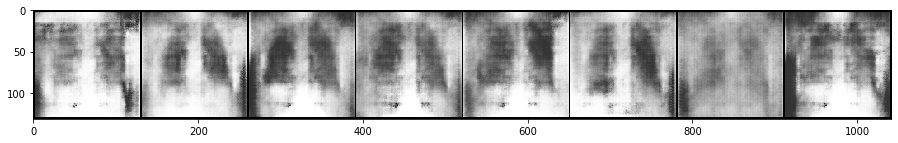

Epoch: 14	Batch: 100/101
Loss G: 6.410643577575684
Loss D: 0.022344518452882767
Epoch: 15/100
Example images:


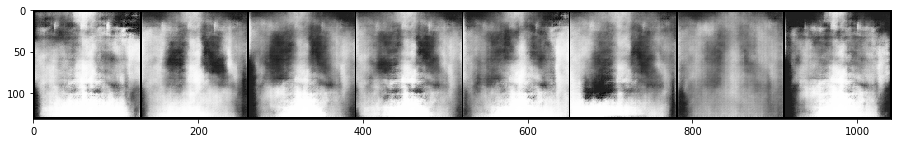

Epoch: 15	Batch: 100/101
Loss G: 12.352248191833496
Loss D: 0.06539883464574814
Epoch: 16/100
Example images:


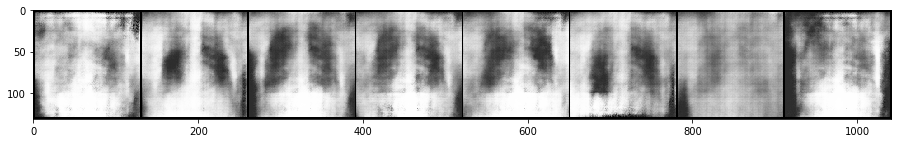

Epoch: 16	Batch: 100/101
Loss G: 13.236618995666504
Loss D: 0.17330476641654968
Epoch: 17/100
Example images:


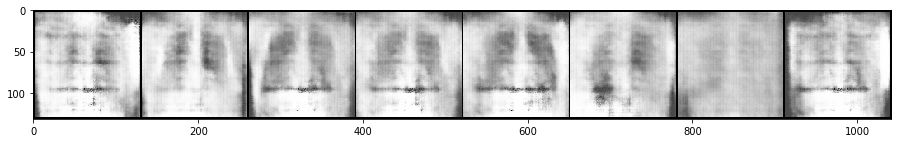

Epoch: 17	Batch: 100/101
Loss G: 6.745864391326904
Loss D: 0.010079653933644295
Epoch: 18/100
Example images:


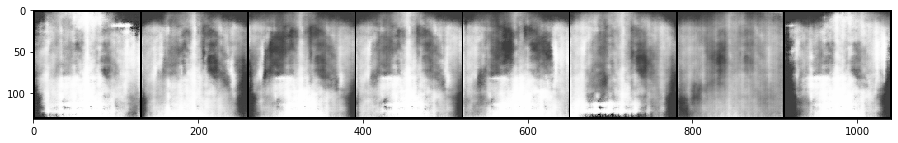

Epoch: 18	Batch: 100/101
Loss G: 7.3610453605651855
Loss D: 0.06450893729925156
Epoch: 19/100
Example images:


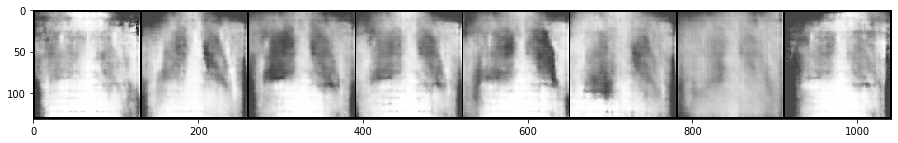

Epoch: 19	Batch: 100/101
Loss G: 6.806033134460449
Loss D: 0.0015529039083048701
Epoch: 20/100
Example images:


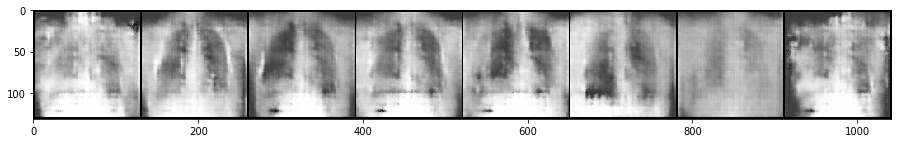

Epoch: 20	Batch: 100/101
Loss G: 14.942872047424316
Loss D: 0.0011221448658034205
Epoch: 21/100
Example images:


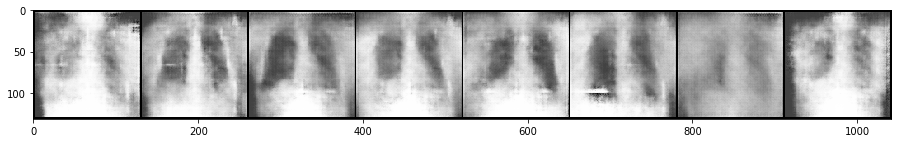

Epoch: 21	Batch: 100/101
Loss G: 7.719923973083496
Loss D: 0.0009993095882236958
Epoch: 22/100
Example images:


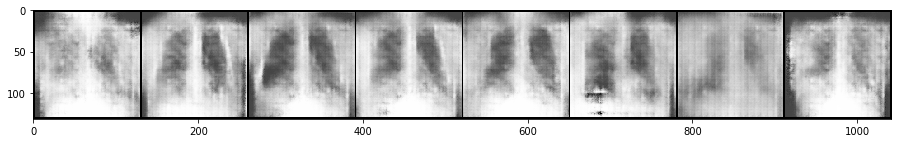

Epoch: 22	Batch: 100/101
Loss G: 7.18802547454834
Loss D: 0.007906302809715271
Epoch: 23/100
Example images:


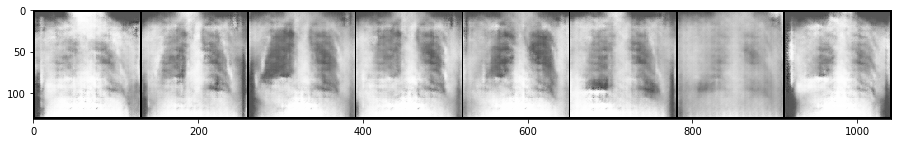

Epoch: 23	Batch: 100/101
Loss G: 7.87955379486084
Loss D: 0.00741473026573658
Epoch: 24/100
Example images:


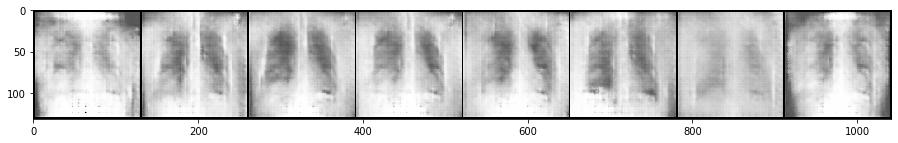

Epoch: 24	Batch: 100/101
Loss G: 8.696738243103027
Loss D: 0.001955739688128233
Epoch: 25/100
Example images:


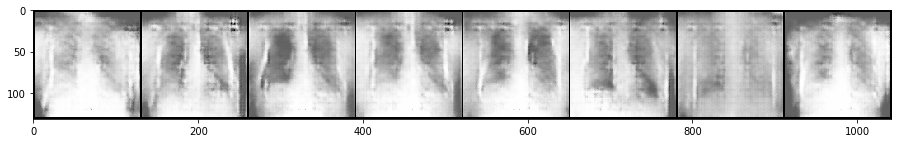

Epoch: 25	Batch: 100/101
Loss G: 9.817375183105469
Loss D: 9.483446774538606e-05
Epoch: 26/100
Example images:


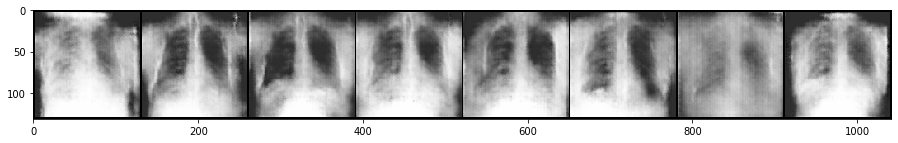

Epoch: 26	Batch: 100/101
Loss G: 11.905481338500977
Loss D: 0.06761275231838226
Epoch: 27/100
Example images:


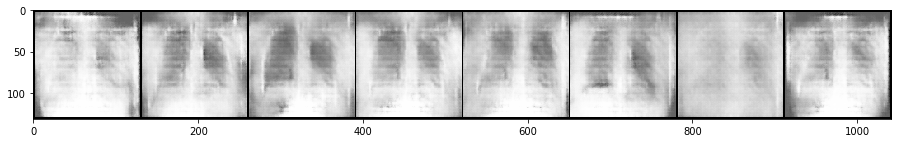

Epoch: 27	Batch: 100/101
Loss G: 6.514063358306885
Loss D: 0.0018560749012976885
Epoch: 28/100
Example images:


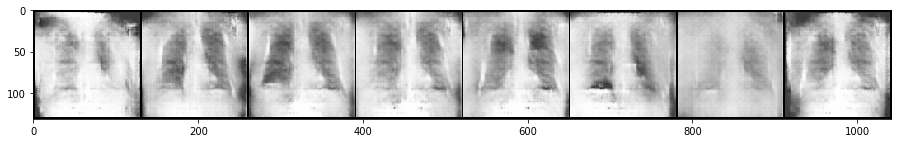

Epoch: 28	Batch: 100/101
Loss G: 5.636399269104004
Loss D: 0.0031758002005517483
Epoch: 29/100
Example images:


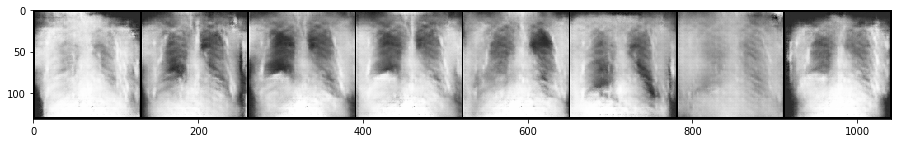

Epoch: 29	Batch: 100/101
Loss G: 7.534045219421387
Loss D: 0.0021595247089862823
Epoch: 30/100
Example images:


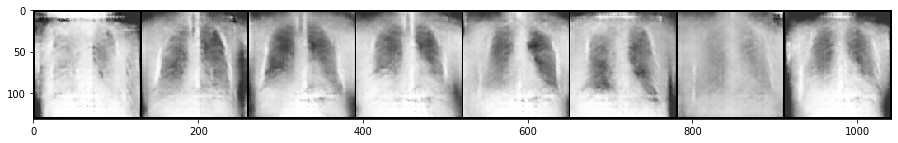

Epoch: 30	Batch: 100/101
Loss G: 7.467198371887207
Loss D: 0.0007827122462913394
Epoch: 31/100
Example images:


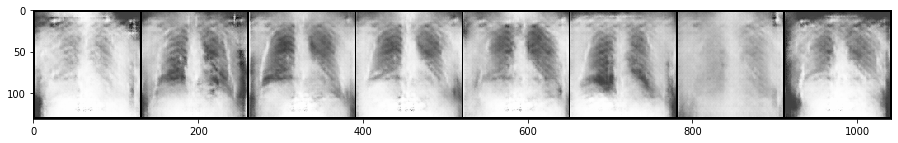

Epoch: 31	Batch: 100/101
Loss G: 11.739703178405762
Loss D: 0.0011754324659705162
Epoch: 32/100
Example images:


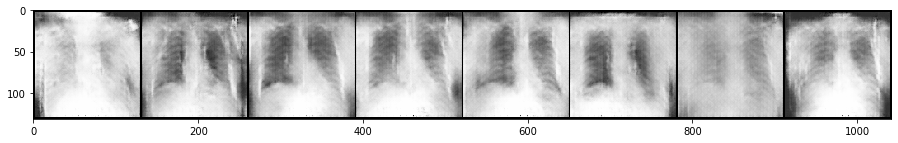

Epoch: 32	Batch: 100/101
Loss G: 14.938281059265137
Loss D: 0.0010482508223503828
Epoch: 33/100
Example images:


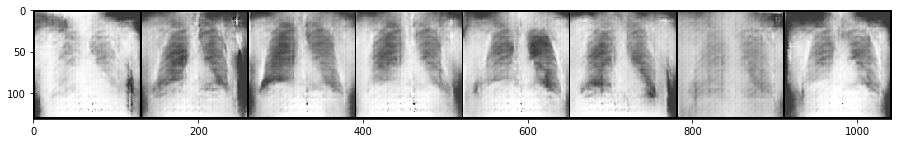

Epoch: 33	Batch: 100/101
Loss G: 6.460296630859375
Loss D: 0.006510329432785511
Epoch: 34/100
Example images:


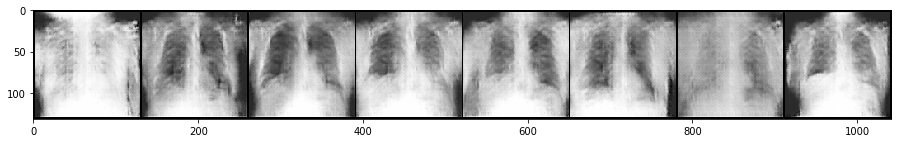

Epoch: 34	Batch: 100/101
Loss G: 8.4972505569458
Loss D: 0.015106158331036568
Epoch: 35/100
Example images:


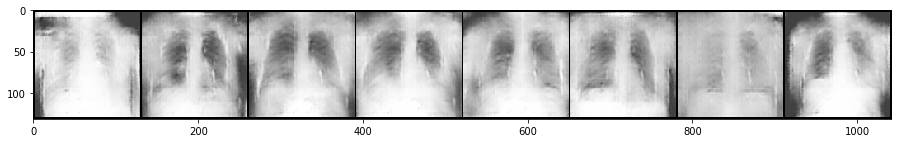

Epoch: 35	Batch: 100/101
Loss G: 7.843535900115967
Loss D: 0.0016552201705053449
Epoch: 36/100
Example images:


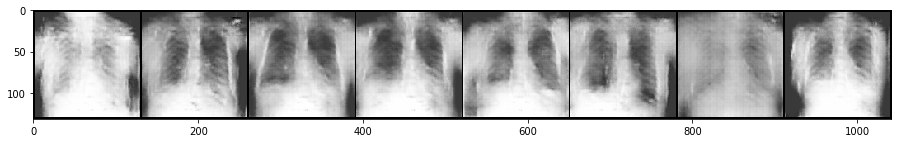

Epoch: 36	Batch: 100/101
Loss G: 8.50804328918457
Loss D: 0.00041370291728526354
Epoch: 37/100
Example images:


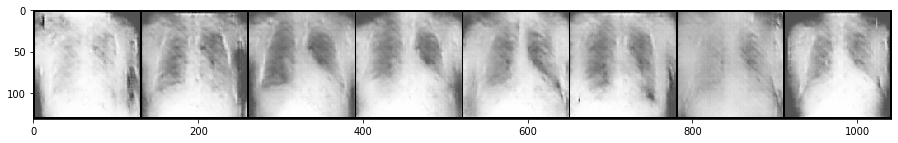

Epoch: 37	Batch: 100/101
Loss G: 11.201980590820312
Loss D: 0.00018401004490442574
Epoch: 38/100
Example images:


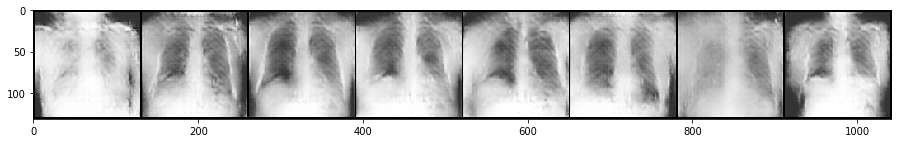

Epoch: 38	Batch: 100/101
Loss G: 9.951297760009766
Loss D: 0.024235064163804054
Epoch: 39/100
Example images:


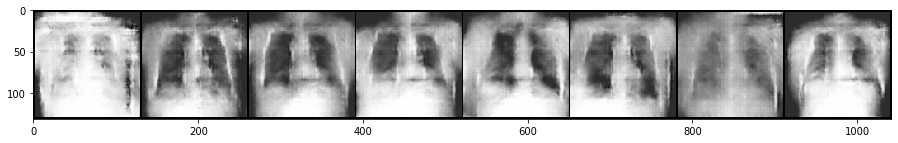

Epoch: 39	Batch: 100/101
Loss G: 12.4105224609375
Loss D: 4.5836641220375896e-05
Epoch: 40/100
Example images:


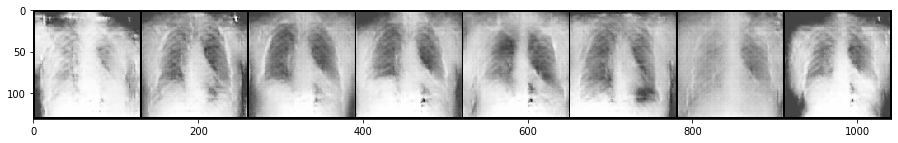

Epoch: 40	Batch: 100/101
Loss G: 11.413919448852539
Loss D: 4.714783062809147e-05
Epoch: 41/100
Example images:


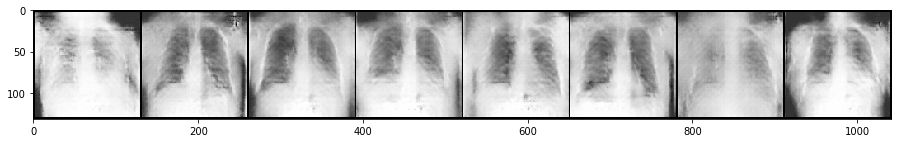

Epoch: 41	Batch: 100/101
Loss G: 6.719827175140381
Loss D: 0.010279456153512001
Epoch: 42/100
Example images:


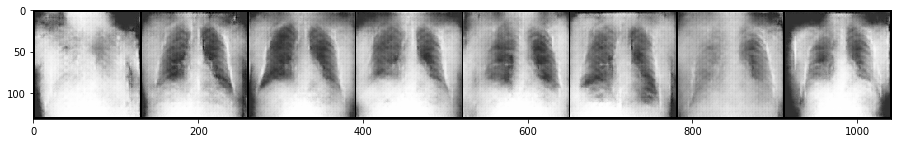

Epoch: 42	Batch: 100/101
Loss G: 12.037046432495117
Loss D: 9.900720760924742e-05
Epoch: 43/100
Example images:


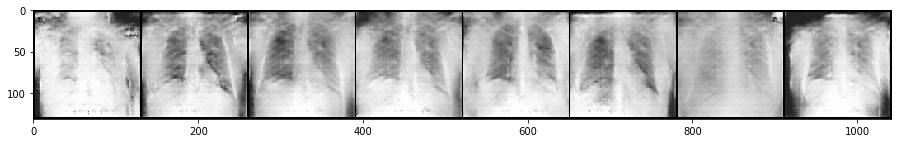

Epoch: 43	Batch: 100/101
Loss G: 15.581991195678711
Loss D: 0.004258779343217611
Epoch: 44/100
Example images:


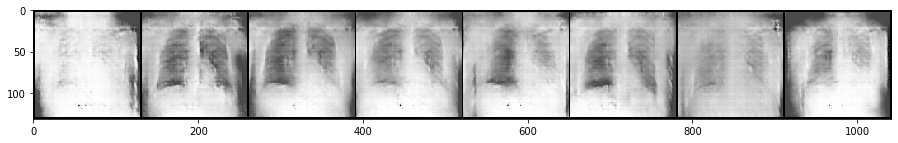

Epoch: 44	Batch: 100/101
Loss G: 18.627477645874023
Loss D: 0.06528733670711517
Epoch: 45/100
Example images:


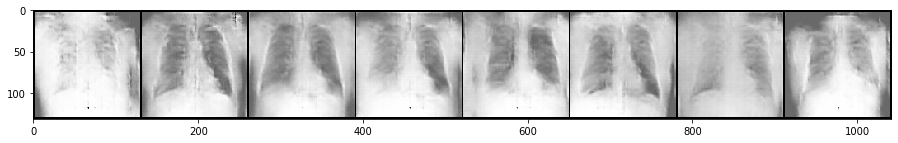

Epoch: 45	Batch: 100/101
Loss G: 8.069293022155762
Loss D: 0.001487866509705782
Epoch: 46/100
Example images:


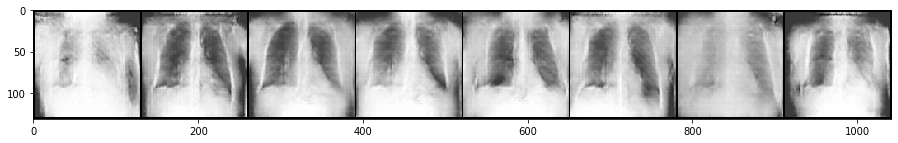

Epoch: 46	Batch: 100/101
Loss G: 13.081192970275879
Loss D: 0.03849628195166588
Epoch: 47/100
Example images:


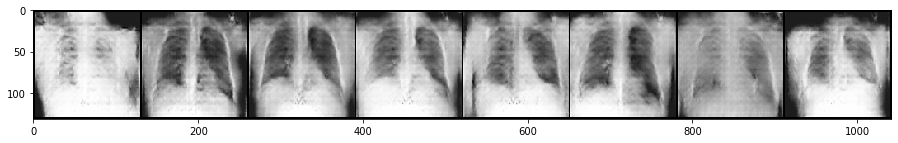

Epoch: 47	Batch: 100/101
Loss G: 10.973652839660645
Loss D: 4.655205339076929e-05
Epoch: 48/100
Example images:


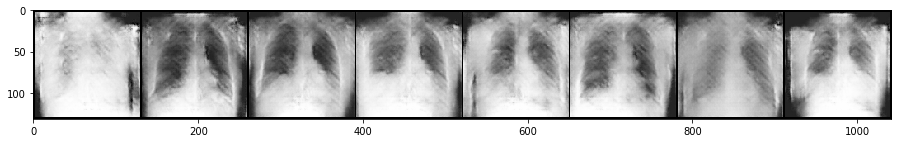

Epoch: 48	Batch: 100/101
Loss G: 9.428707122802734
Loss D: 0.0016517536714673042
Epoch: 49/100
Example images:


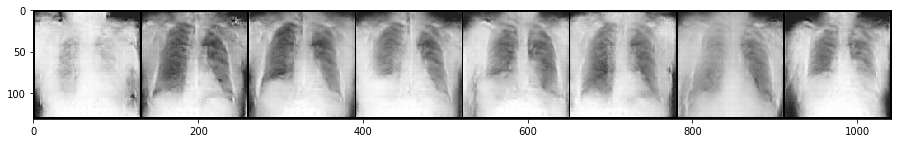

Epoch: 49	Batch: 100/101
Loss G: 9.259207725524902
Loss D: 0.008043499663472176
Epoch: 50/100
Example images:


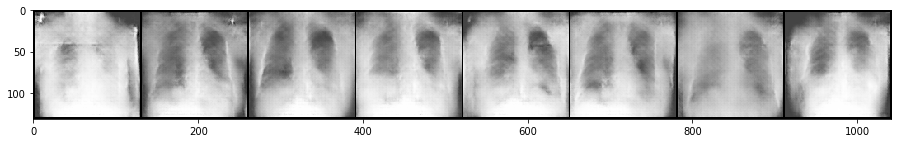

Epoch: 50	Batch: 100/101
Loss G: 10.31729507446289
Loss D: 7.069323328323662e-05
Epoch: 51/100
Example images:


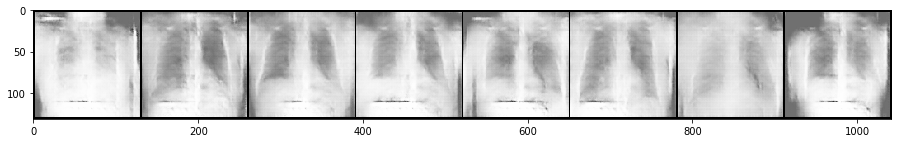

Epoch: 51	Batch: 100/101
Loss G: 15.271051406860352
Loss D: 1.4305121567304013e-06
Epoch: 52/100
Example images:


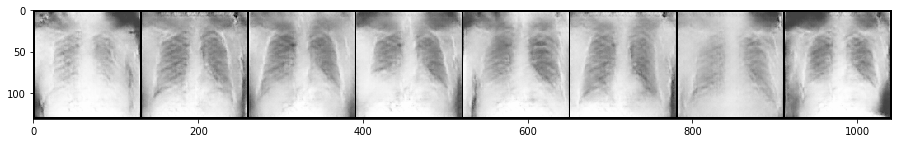

Epoch: 52	Batch: 100/101
Loss G: 17.1474666595459
Loss D: 1.0311656296835281e-05
Epoch: 53/100
Example images:


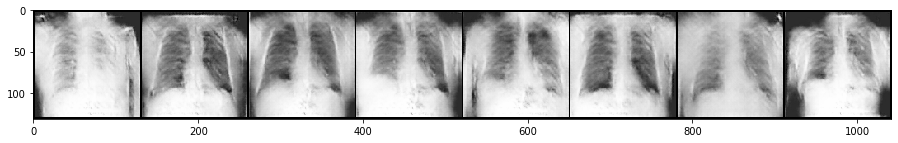

Epoch: 53	Batch: 100/101
Loss G: 7.299629211425781
Loss D: 0.0057343989610672
Epoch: 54/100
Example images:


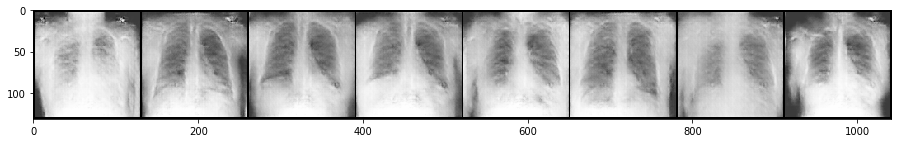

Epoch: 54	Batch: 100/101
Loss G: 12.641032218933105
Loss D: 3.701515743159689e-05
Epoch: 55/100
Example images:


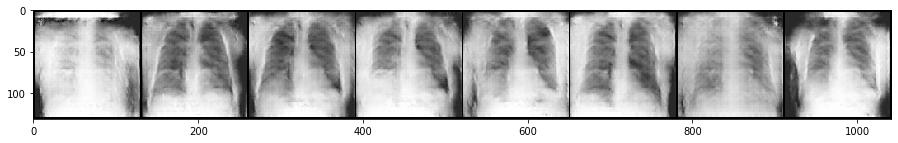

Epoch: 55	Batch: 100/101
Loss G: 8.969664573669434
Loss D: 0.003452589036896825
Epoch: 56/100
Example images:


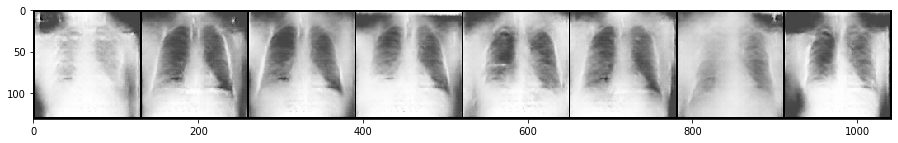

Epoch: 56	Batch: 100/101
Loss G: 9.087742805480957
Loss D: 0.0002222237817477435
Epoch: 57/100
Example images:


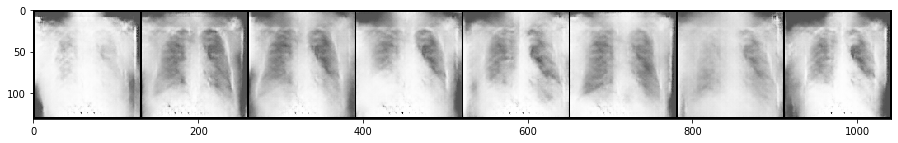

Epoch: 57	Batch: 100/101
Loss G: 11.065723419189453
Loss D: 0.00012237484042998403
Epoch: 58/100
Example images:


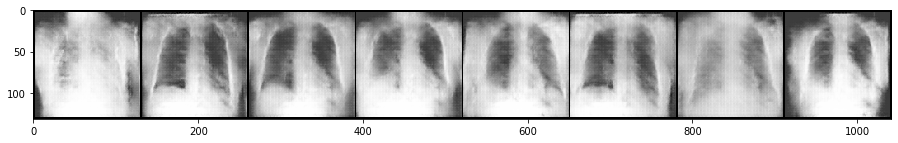

Epoch: 58	Batch: 100/101
Loss G: 8.210756301879883
Loss D: 0.0029945210553705692
Epoch: 59/100
Example images:


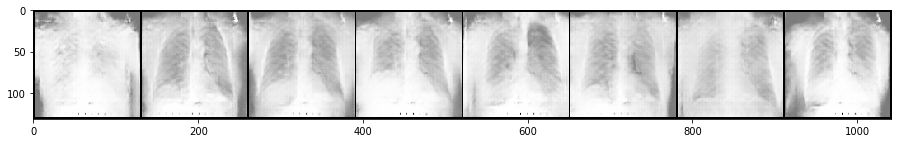

Epoch: 59	Batch: 100/101
Loss G: 8.19225788116455
Loss D: 0.0005888706655241549
Epoch: 60/100
Example images:


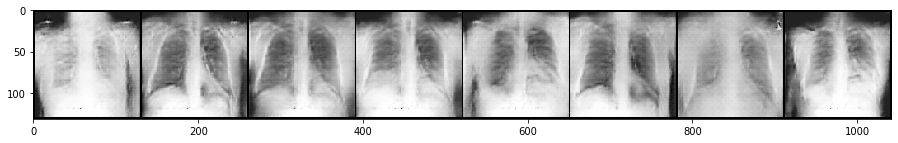

Epoch: 60	Batch: 100/101
Loss G: 7.7806620597839355
Loss D: 0.001599449198693037
Epoch: 61/100
Example images:


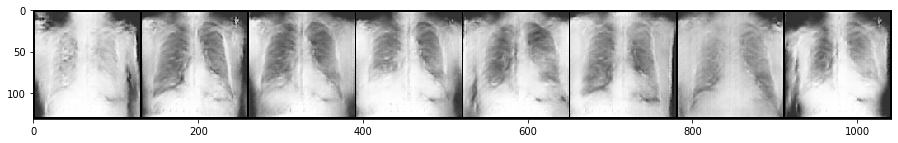

Epoch: 61	Batch: 100/101
Loss G: 14.36014175415039
Loss D: 1.1920933502551634e-06
Epoch: 62/100
Example images:


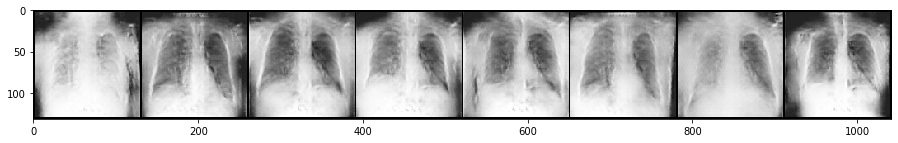

Epoch: 62	Batch: 100/101
Loss G: 26.12567710876465
Loss D: 0.00016941074864007533
Epoch: 63/100
Example images:


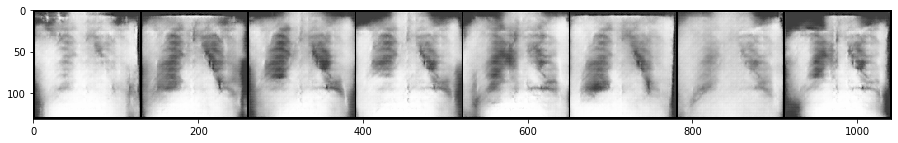

Epoch: 63	Batch: 100/101
Loss G: 8.004002571105957
Loss D: 0.0011251302203163505
Epoch: 64/100
Example images:


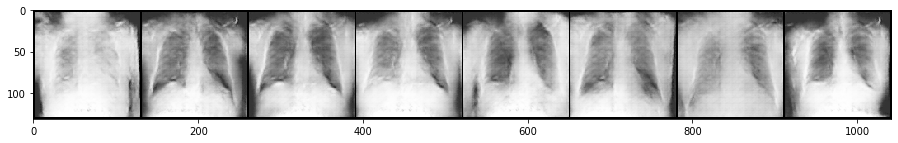

Epoch: 64	Batch: 100/101
Loss G: 7.726971626281738
Loss D: 0.0037863904144614935
Epoch: 65/100
Example images:


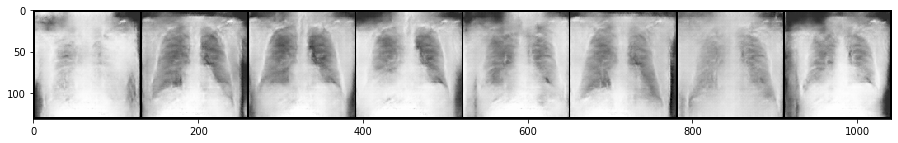

Epoch: 65	Batch: 100/101
Loss G: 14.74091625213623
Loss D: 3.260425364715047e-05
Epoch: 66/100
Example images:


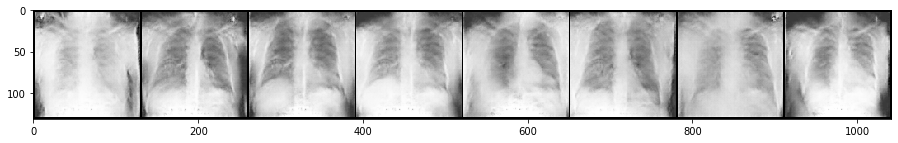

Epoch: 66	Batch: 100/101
Loss G: 8.128222465515137
Loss D: 0.0006552098202519119
Epoch: 67/100
Example images:


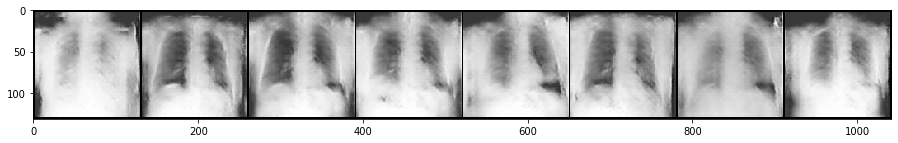

Epoch: 67	Batch: 100/101
Loss G: 16.668439865112305
Loss D: 0.04641949012875557
Epoch: 68/100
Example images:


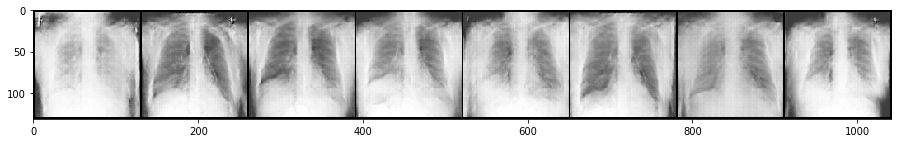

Epoch: 68	Batch: 100/101
Loss G: 11.62293815612793
Loss D: 1.698742198641412e-05
Epoch: 69/100
Example images:


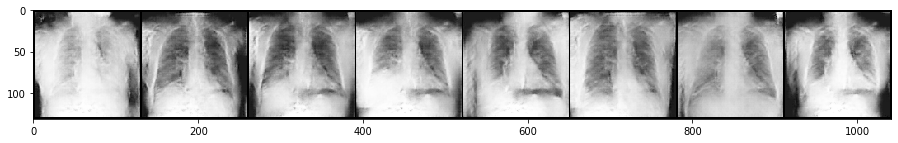

Epoch: 69	Batch: 100/101
Loss G: 12.172141075134277
Loss D: 0.00014049551100470126
Epoch: 70/100
Example images:


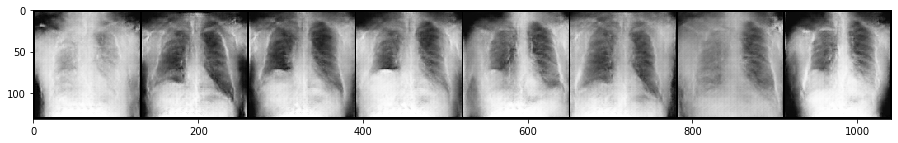

Epoch: 70	Batch: 100/101
Loss G: 8.881616592407227
Loss D: 0.0004466523532755673
Epoch: 71/100
Example images:


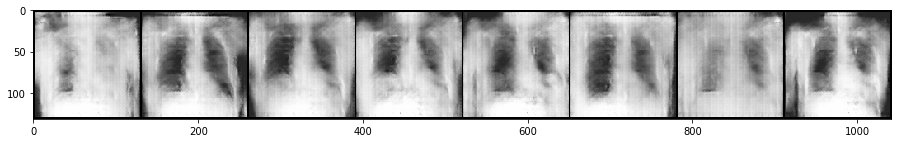

Epoch: 71	Batch: 100/101
Loss G: 12.209150314331055
Loss D: 9.757688530953601e-05
Epoch: 72/100
Example images:


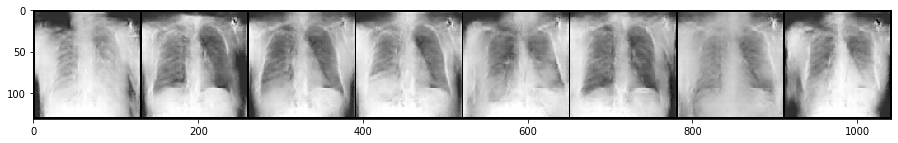

Epoch: 72	Batch: 100/101
Loss G: 18.35251235961914
Loss D: 0.06281030178070068
Epoch: 73/100
Example images:


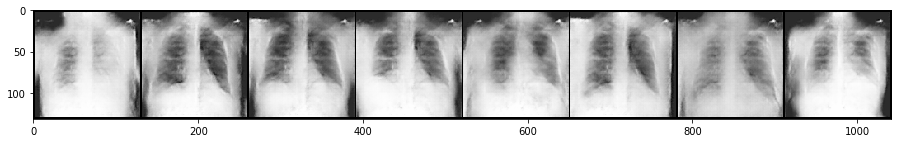

Epoch: 73	Batch: 100/101
Loss G: 7.886264324188232
Loss D: 0.0032291614916175604
Epoch: 74/100
Example images:


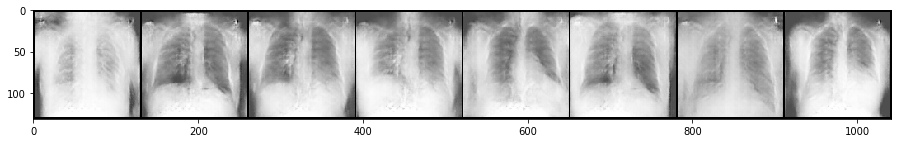

Epoch: 74	Batch: 100/101
Loss G: 10.206730842590332
Loss D: 6.652070442214608e-05
Epoch: 75/100
Example images:


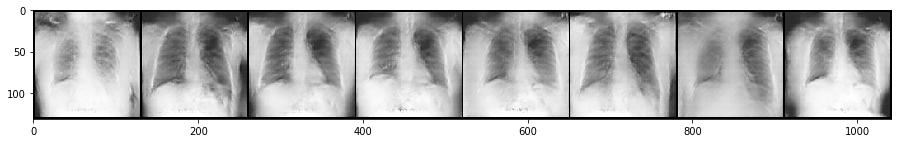

Epoch: 75	Batch: 100/101
Loss G: 13.566896438598633
Loss D: 3.874306003126549e-06
Epoch: 76/100
Example images:


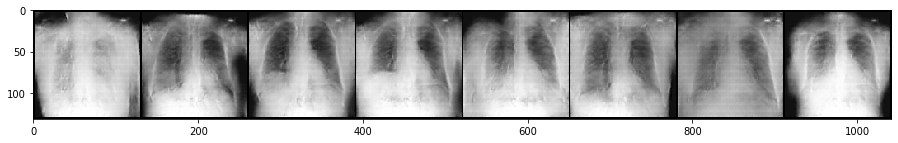

Epoch: 76	Batch: 100/101
Loss G: 11.605934143066406
Loss D: 2.5630195523262955e-05
Epoch: 77/100
Example images:


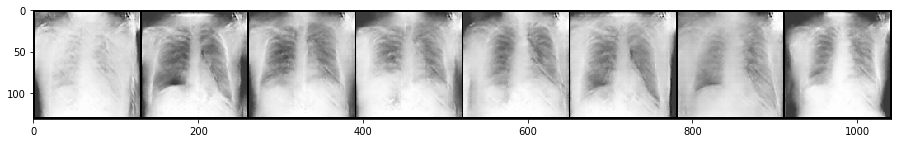

Epoch: 77	Batch: 100/101
Loss G: 9.722122192382812
Loss D: 8.571508806198835e-05
Epoch: 78/100
Example images:


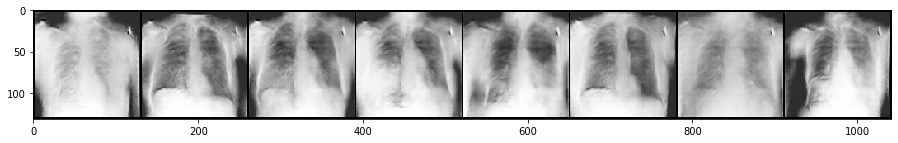

Epoch: 78	Batch: 100/101
Loss G: 9.819387435913086
Loss D: 8.517804235452786e-05
Epoch: 79/100
Example images:


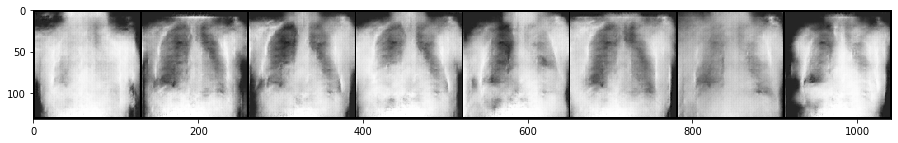

Epoch: 79	Batch: 100/101
Loss G: 8.584027290344238
Loss D: 0.002038511447608471
Epoch: 80/100
Example images:


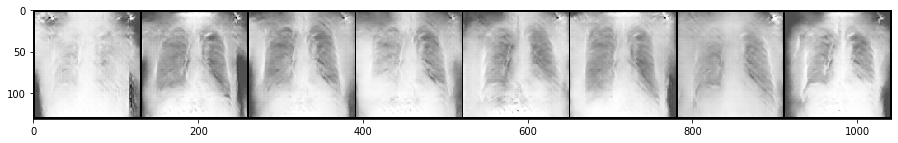

Epoch: 80	Batch: 100/101
Loss G: 16.45852279663086
Loss D: 3.576279254957626e-07
Epoch: 81/100
Example images:


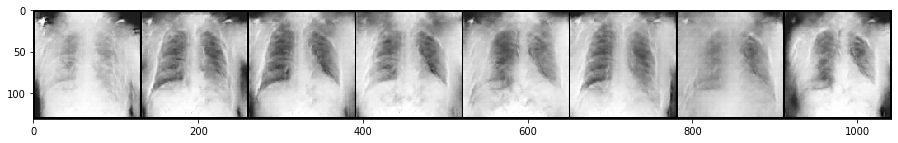

Epoch: 81	Batch: 100/101
Loss G: 11.017019271850586
Loss D: 0.00010979619401041418
Epoch: 82/100
Example images:


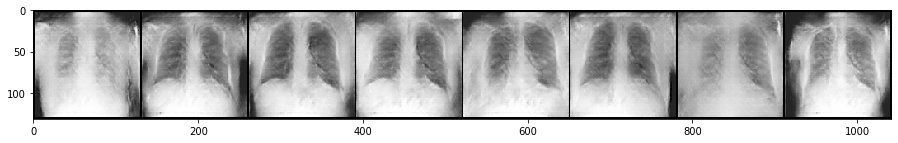

Epoch: 82	Batch: 100/101
Loss G: 7.838266372680664
Loss D: 0.0004769496445078403
Epoch: 83/100
Example images:


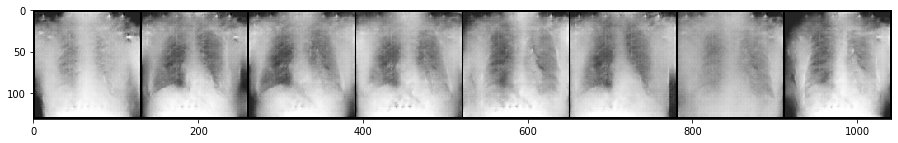

Epoch: 83	Batch: 100/101
Loss G: 10.709309577941895
Loss D: 0.02312786504626274
Epoch: 84/100
Example images:


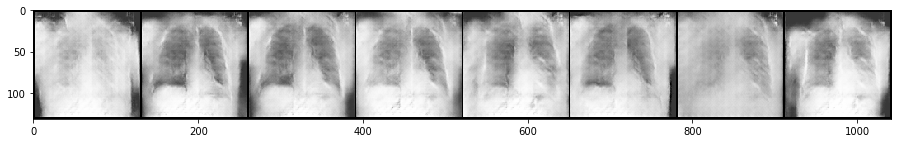

Epoch: 84	Batch: 100/101
Loss G: 12.086711883544922
Loss D: 2.6703084586188197e-05
Epoch: 85/100
Example images:


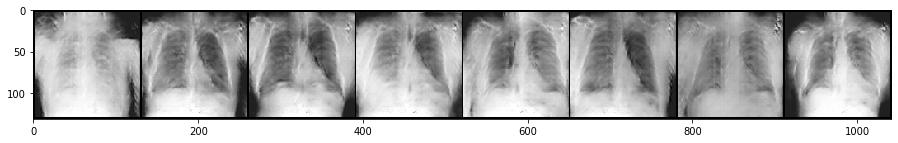

Epoch: 85	Batch: 100/101
Loss G: 8.333498001098633
Loss D: 0.011882971040904522
Epoch: 86/100
Example images:


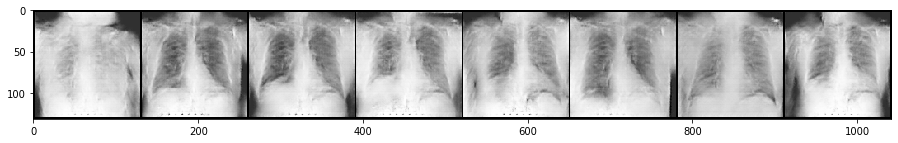

Epoch: 86	Batch: 100/101
Loss G: 9.543210983276367
Loss D: 0.0018279794603586197
Epoch: 87/100
Example images:


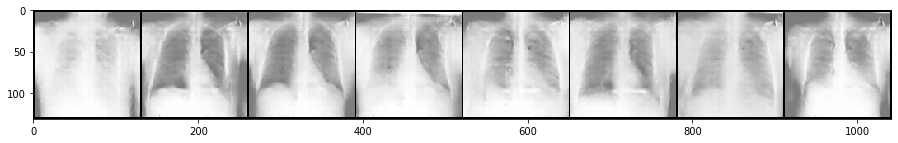

Epoch: 87	Batch: 100/101
Loss G: 13.87242603302002
Loss D: 4.947192337567685e-06
Epoch: 88/100
Example images:


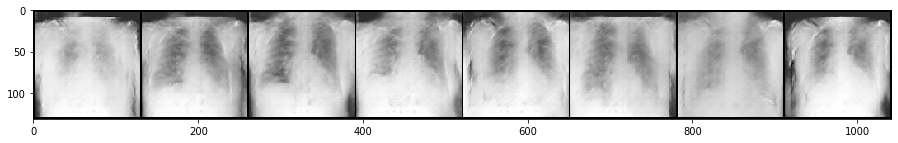

Epoch: 88	Batch: 100/101
Loss G: 14.101009368896484
Loss D: 5.781662366644014e-06
Epoch: 89/100
Example images:


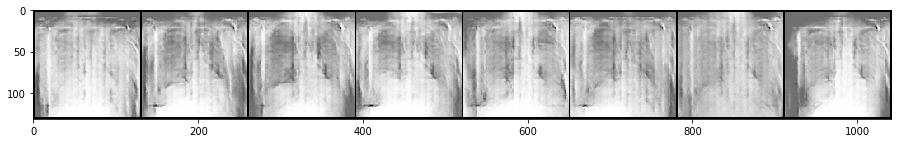

Epoch: 89	Batch: 100/101
Loss G: 10.034614562988281
Loss D: 0.00011164550960529596
Epoch: 90/100
Example images:


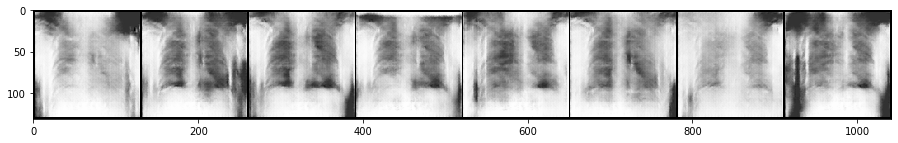

Epoch: 90	Batch: 100/101
Loss G: 10.079837799072266
Loss D: 7.111085869837552e-05
Epoch: 91/100
Example images:


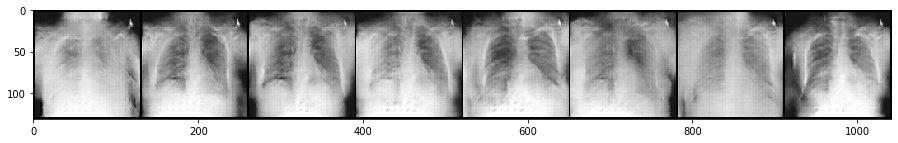

Epoch: 91	Batch: 100/101
Loss G: 13.869083404541016
Loss D: 0.0002441699034534395
Epoch: 92/100
Example images:


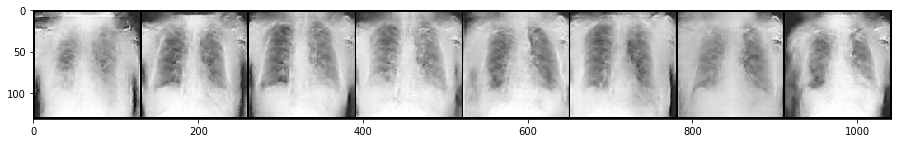

Epoch: 92	Batch: 100/101
Loss G: 9.031623840332031
Loss D: 0.00020726639195345342
Epoch: 93/100
Example images:


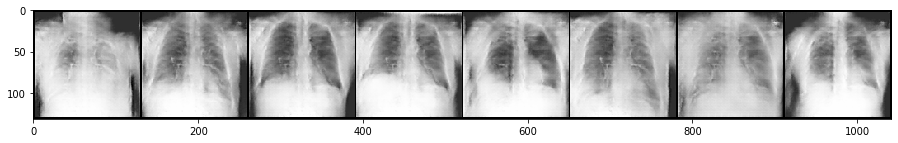

Epoch: 93	Batch: 100/101
Loss G: 32.95189666748047
Loss D: 0.13021284341812134
Epoch: 94/100
Example images:


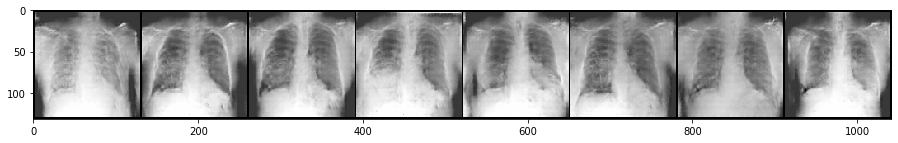

Epoch: 94	Batch: 100/101
Loss G: 13.923563957214355
Loss D: 1.1086514859925956e-05
Epoch: 95/100
Example images:


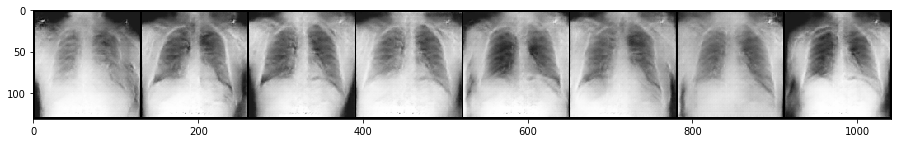

Epoch: 95	Batch: 100/101
Loss G: 17.857627868652344
Loss D: 7.182617264334112e-05
Epoch: 96/100
Example images:


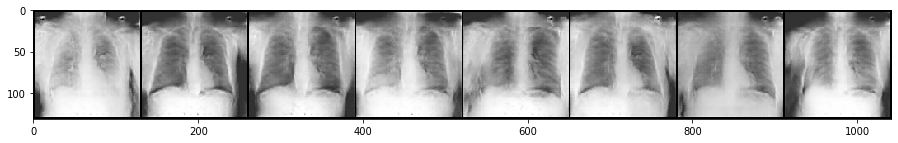

Epoch: 96	Batch: 100/101
Loss G: 10.243894577026367
Loss D: 9.513183613307774e-05
Epoch: 97/100
Example images:


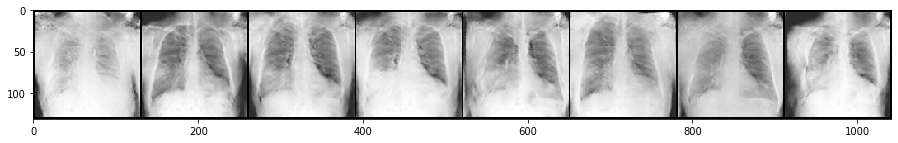

Epoch: 97	Batch: 100/101
Loss G: 14.710506439208984
Loss D: 1.3768742064712569e-05
Epoch: 98/100
Example images:


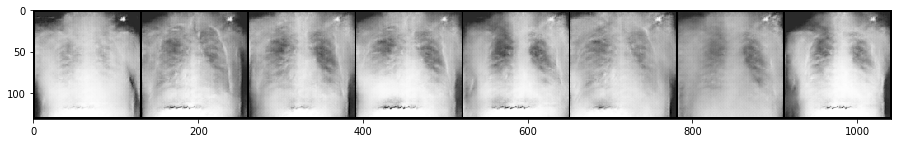

Epoch: 98	Batch: 100/101
Loss G: 10.504499435424805
Loss D: 0.01230691745877266
Epoch: 99/100
Example images:


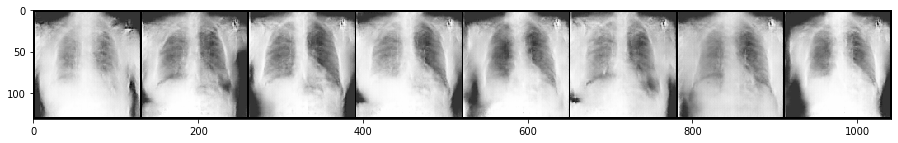

Epoch: 99	Batch: 86/101

In [ ]:
for epoch in range(n_epochs):
    print(f"Epoch: {epoch}/{n_epochs}")
    print("Example images:")
    generated_images = G(test_noise).detach().cpu()
    show_images(generated_images)
    
    for i, (batch, _) in enumerate(data_loader):
        print(f"\rEpoch: {epoch}\tBatch: {i}/{len(data_loader)}", end='')
        ## Train the discriminiator ##
        D.zero_grad()

        # Compute error on real data
        real = Variable(batch).to(gpu)
        real_labels = Variable(torch.ones(real.size(0), 1, 1, 1)).to(gpu)
        real_predictions = D(real)
        
        d_error_real = compute_loss(real_predictions, real_labels)
        
        # Compute error on fake data
        noise = Variable(torch.randn(real.size(0), 100, 1, 1)).to(gpu)
        fake = G(noise)
        fake_predictions = D(fake.detach())
        fake_labels = Variable(torch.zeros(real.size(0), 1, 1, 1)).to(gpu)
        d_error_fake = compute_loss(fake_predictions, fake_labels)
        
        # Accumulate and backpropogate on combined error
        d_error_total = d_error_real + d_error_fake
        d_error_total.backward()
        optimizer_d.step()
        
        ## Train the generator ##
        G.zero_grad()
        
        # Compute rate of fakes being detected
        goal_labels = Variable(torch.ones(real.size(0), 1, 1, 1)).to(gpu)
        results = D(fake)
        g_error = compute_loss(results, goal_labels)
        
        # Backpropogate and update weights
        g_error.backward()
        optimizer_g.step()
    
    print("")
    print(f"Loss G: {g_error}")
    print(f"Loss D: {d_error_total}")

In [15]:
torch.save(G.state_dict(), "/home/seif.younis/Deep Learning and Medical Imaging/examples/Toy GAN/trained models/trained_generator")
torch.save(D.state_dict(), "/home/seif.younis/Deep Learning and Medical Imaging/examples/Toy GAN/trained models/trained_discriminator")